In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/hardfakevsrealfaces/data.csv
/kaggle/input/hardfakevsrealfaces/fake/fake_218.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_94.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_289.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_507.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_615.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_636.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_160.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_559.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_488.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_93.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_661.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_297.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_610.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_474.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_154.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_308.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_527.jpg
/kaggle/input/hardfakevsrealfaces/fake/fake_593.jpg
/kaggle/input/hardfakev

In [3]:
import os
import tarfile
import random
import gc
import warnings
import itertools

import numpy as np
import pandas as pd

import cv2
from PIL import Image
import matplotlib.pyplot as plt

In [4]:
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.data import Dataset
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import Input, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.layers import GlobalAveragePooling2D, LeakyReLU, ReLU
from tensorflow.keras import layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.callbacks import Callback,EarlyStopping,ReduceLROnPlateau
from tensorflow.keras.utils import plot_model


from sklearn.model_selection import train_test_split
from sklearn.metrics import  classification_report 

warnings.filterwarnings('ignore')

In [5]:
df_train = pd.read_csv('../input/140k-real-and-fake-faces/train.csv',index_col=0)
df_val = pd.read_csv('../input/140k-real-and-fake-faces/valid.csv',index_col=0)
df_test = pd.read_csv('../input/140k-real-and-fake-faces/test.csv',index_col=0)

In [6]:
df_train.head()

,original_path,id,label,label_str,path
0,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,31355,1,real,train/real/31355.jpg
1,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,02884,1,real,train/real/02884.jpg
2,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,33988,1,real,train/real/33988.jpg
3,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,53875,1,real,train/real/53875.jpg
4,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,24149,1,real,train/real/24149.jpg


In [7]:
df_val.head()

,original_path,id,label,label_str,path
0,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,20001,1,real,valid/real/20001.jpg
1,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,11264,1,real,valid/real/11264.jpg
2,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,19817,1,real,valid/real/19817.jpg
3,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,46851,1,real,valid/real/46851.jpg
4,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,10411,1,real,valid/real/10411.jpg


In [8]:
df_test.head()

,original_path,id,label,label_str,path
0,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,18233,1,real,test/real/18233.jpg
1,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,54317,1,real,test/real/54317.jpg
2,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,40155,1,real,test/real/40155.jpg
3,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,12875,1,real,test/real/12875.jpg
4,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,52543,1,real,test/real/52543.jpg


In [9]:
# remove not needed columns and shuffle
df_train = df_train.drop(columns=['original_path','id','label_str']).sample(frac=1)
df_val = df_val.drop(columns=['original_path','id','label_str']).sample(frac=1)
df_test = df_test.drop(columns=['original_path','id','label_str']).sample(frac=1)

# rectify labels
df_train['label'] = 1 - df_train['label']
df_val['label'] = 1 - df_val['label']
df_test['label'] = 1 - df_test['label']

In [10]:
# split datasets by columns
y_train = df_train['label']
X_train = df_train['path']

y_val = df_val['label']
X_val = df_val['path']

y_test = df_test['label']
X_test = df_test['path']

<BarContainer object of 2 artists>

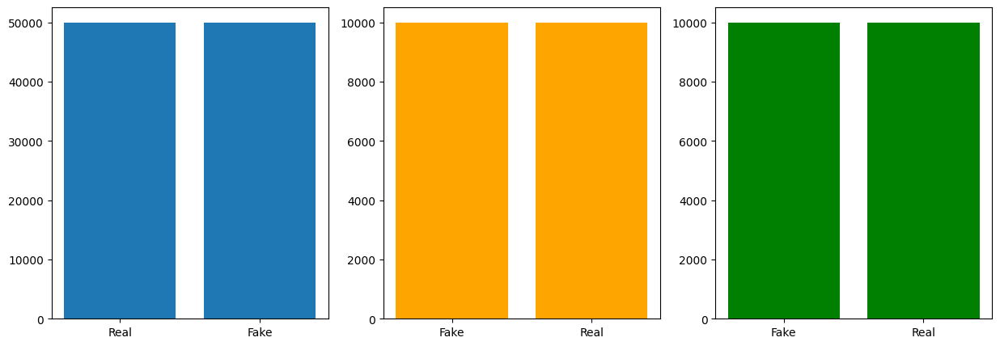

In [11]:
 # Check class balance for each dataset
fig, axs = plt.subplots(1,3,figsize=(15,5))
axs[0].bar(y_train.value_counts().index, y_train.value_counts(), tick_label=['Real','Fake'])
axs[1].bar(y_val.value_counts().index, y_val.value_counts(), tick_label=['Real','Fake'], color='orange')
axs[2].bar(y_test.value_counts().index, y_test.value_counts(), tick_label=['Real','Fake'], color='green')

In [12]:
# extract the amount of data to be used
X_train = X_train[:40000]
y_train = y_train[:40000]
X_val = X_val[:4000]
y_val = y_val[:4000]
X_test = X_test[:4000]
y_test = y_test[:4000]

<BarContainer object of 2 artists>

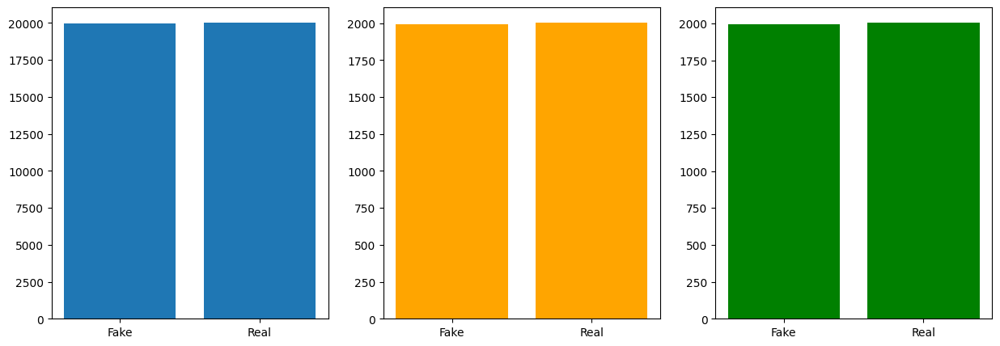

In [13]:
# Check for class balance in extracted data
fig, axs = plt.subplots(1,3,figsize=(15,5))
axs[0].bar(y_train.value_counts().index, y_train.value_counts(), tick_label=['Real','Fake'])
axs[1].bar(y_val.value_counts().index, y_val.value_counts(), tick_label=['Real','Fake'], color='orange')
axs[2].bar(y_test.value_counts().index, y_test.value_counts(), tick_label=['Real','Fake'], color='green')

In [14]:
# map each image name to its path
X_train = X_train.map(lambda x: '../input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/' + x)
X_val = X_val.map(lambda x: '../input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/' + x)
X_test = X_test.map(lambda x: '../input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/' + x)

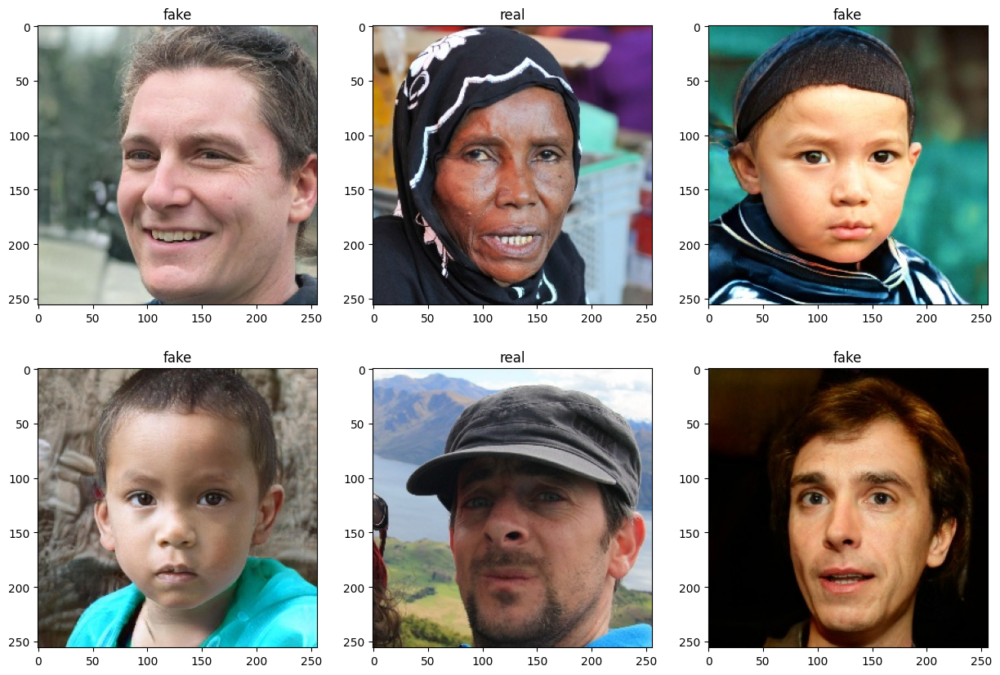

In [15]:
# show a sample of images from the dataset with corresponding labels
label_arg = {0:'real', 1:'fake'}
fig, axs = plt.subplots(2,3,figsize=(15,10))
for i in range(2):
    for j in range(3):
        random_idx = np.random.randint(0,X_train.shape[0],1)
        img = Image.open(X_train.iloc[int(random_idx)])
        label = y_train.iloc[int(random_idx)]
        axs[i,j].imshow(img)
        axs[i,j].set_title(label_arg[label])

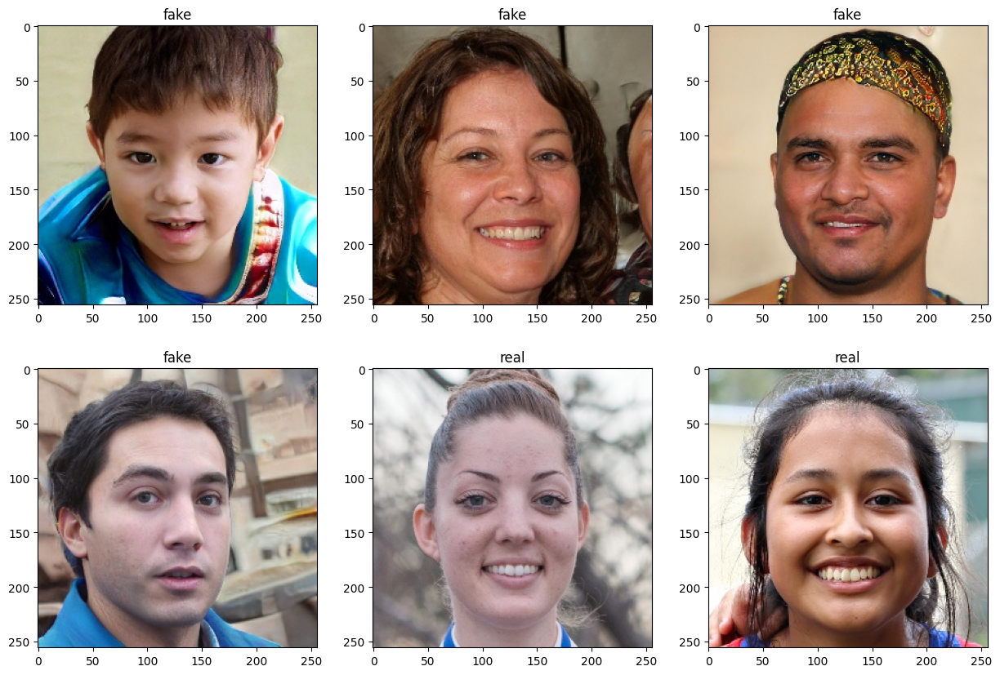

In [16]:
# show a sample of images from the dataset with corresponding labels
label_arg = {0:'real', 1:'fake'}
fig, axs = plt.subplots(2,3,figsize=(15,10))
for i in range(2):
    for j in range(3):
        random_idx = np.random.randint(0,X_train.shape[0],1)
        img = Image.open(X_train.iloc[int(random_idx)])
        label = y_train.iloc[int(random_idx)]
        axs[i,j].imshow(img)
        axs[i,j].set_title(label_arg[label])

In [17]:
# import second dataset
df_test_2 = pd.read_csv('../input/hardfakevsrealfaces/data.csv').sample(frac=1)

In [18]:
df_test_2

,images_id,label
352,real_416,real
1066,fake_529,fake
1207,fake_656,fake
1284,fake_95,fake
77,real_169,real
...,...,...
498,real_548,real
604,fake_112,fake
425,real_482,real
1039,fake_504,fake


In [19]:
# set the path for each image and create numerical labels
df_test_2['images_id'] = df_test_2['images_id'].apply(lambda x: '../input/hardfakevsrealfaces/real/'+x+'.jpg'\
                                                      if x[:4]=='real' else '../input/hardfakevsrealfaces/fake/'+x+'.jpg')
df_test_2['label'] = df_test_2['label'].map(lambda x: 1 if x=='fake' else 0)
df_test_2.rename(columns={'images_id':'path'}, inplace=True)
df_test_2

,path,label
352,../input/hardfakevsrealfaces/real/real_416.jpg,0
1066,../input/hardfakevsrealfaces/fake/fake_529.jpg,1
1207,../input/hardfakevsrealfaces/fake/fake_656.jpg,1
1284,../input/hardfakevsrealfaces/fake/fake_95.jpg,1
77,../input/hardfakevsrealfaces/real/real_169.jpg,0
...,...,...
498,../input/hardfakevsrealfaces/real/real_548.jpg,0
604,../input/hardfakevsrealfaces/fake/fake_112.jpg,1
425,../input/hardfakevsrealfaces/real/real_482.jpg,0
1039,../input/hardfakevsrealfaces/fake/fake_504.jpg,1


<BarContainer object of 2 artists>

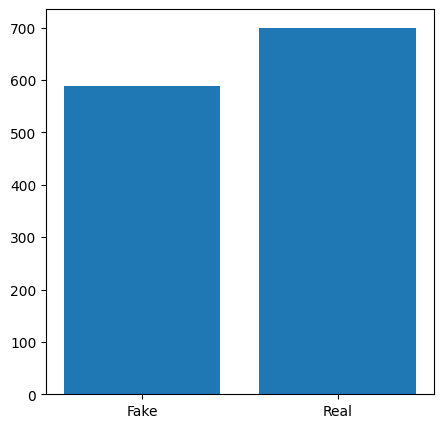

In [20]:
# check the class balance
fig = plt.figure(figsize=(5,5))
plt.bar(df_test_2['label'].value_counts().index, df_test_2['label'].value_counts(), tick_label=['Real','Fake'])

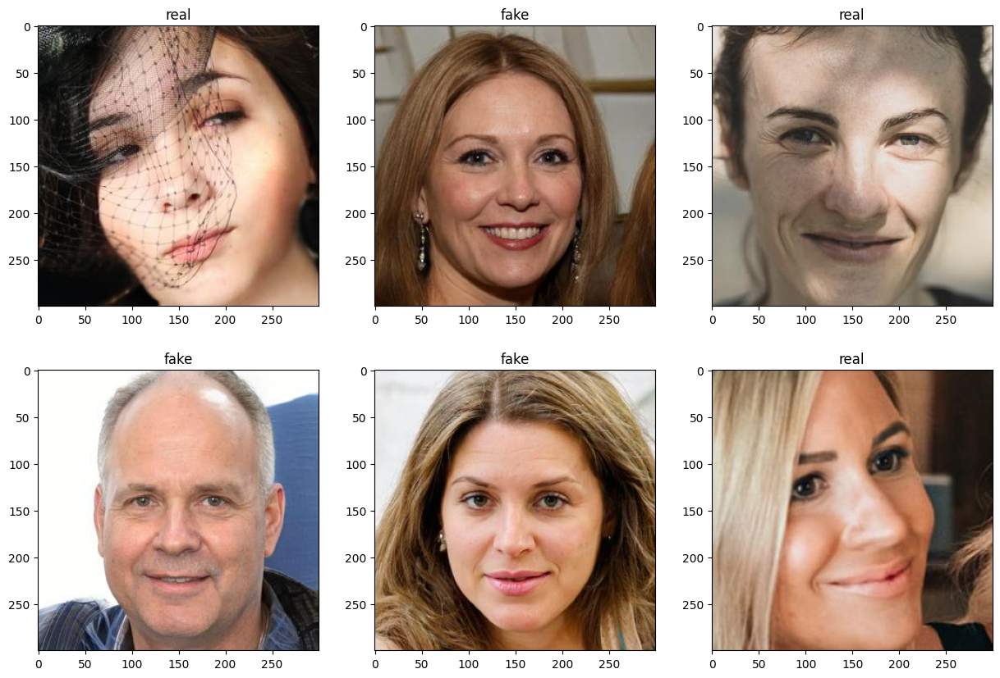

In [21]:
# show a sample of images with labels
fig, axs = plt.subplots(2,3,figsize=(15,10))
for i in range(2):
    for j in range(3):
        random_idx = np.random.randint(0,df_test_2.shape[0],1)
        img = Image.open(df_test_2['path'].iloc[int(random_idx)])
        label = df_test_2['label'].iloc[int(random_idx)]
        axs[i,j].imshow(img)
        axs[i,j].set_title(label_arg[label])

In [22]:
# Setting seeds
seed = 42
np.random.seed(seed)
random.seed(seed)
tf.random.set_seed(seed)

# Setting constants
batch_size = 32
image_size = 224
channels = 3
shuffle_size = 256 

# Setting auto tune
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [23]:
# defining functions to decode image paths and preprocess images 
def read_img():
    def img_to_array(path):
        image = tf.io.read_file(path)
        image = tf.image.decode_jpeg(image, channels=channels)
        image = tf.cast(image, tf.float32)
        image = tf.image.resize(image, (image_size, image_size))
        image = image/255.0
        #image = tf.image.rgb_to_grayscale(image)
        return image
    def mapping(path, score):
        return img_to_array(path), score
    return mapping

def augment(image, score):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_contrast(image, 0.95, 1.05)
    image = tf.image.random_brightness(image, 0.1)
    image = tf.image.random_crop(image, (200, 200, 3))
    image = tf.image.resize(image, (image_size, image_size))
    return image, score

def preprocess(ds, batch_size, ds_type):
    read_img_fn = read_img()
    ds = ds.map(read_img_fn, num_parallel_calls=AUTOTUNE)
    if ds_type=='train':
        ds = ds.map(augment, num_parallel_calls=AUTOTUNE)
        ds = ds.shuffle(shuffle_size, reshuffle_each_iteration=True)
    ds = ds.batch(batch_size)
    ds = ds.prefetch(AUTOTUNE)
    return ds

# define a function that creates a tesnorflow dataset
def create_ds(X,y, ds_type):
    ds = Dataset.from_tensor_slices((X,y))
    ds = preprocess(ds, batch_size, ds_type)
    return ds

In [24]:
# create tensorflow datasets for train, validation and test
Train_ds = create_ds(X_train, y_train, 'train')
Val_ds = create_ds(X_val, y_val, 'train')
Test_ds = create_ds(X_test, y_test, 'test')

2025-10-17 10:14:48.019708: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [25]:
# create the second testing tensorflow dataset
Test_ds_2 = create_ds(df_test_2['path'],df_test_2['label'], 'test')

In [26]:
# Load the pretained model
pretrained_model = tf.keras.applications.ResNet50V2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

# freeze layers
pretrained_model.trainable=False
for layer in pretrained_model.layers[-5:]:
    if not isinstance(layer, layers.BatchNormalization):
           layer.trainable = True
#for layer in pretrained_model.layers[:-5]:
#    layer.trainable=False

# create new model
inputs = pretrained_model.input
x = Dense(128, activation='relu')(pretrained_model.output)
x = Dropout(0.3)(x)
x = Dense(32, activation='relu')(x)
x = Dropout(0.3)(x)

outputs = Dense(1, activation='sigmoid')(x)

model = Model(inputs=inputs, outputs=outputs)

model.compile(loss= tf.keras.losses.BinaryCrossentropy(label_smoothing=0.1), 
            optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4),
            metrics=['binary_accuracy'])

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [27]:
'''%%time
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=5, cooldown=2, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10, restore_best_weights=True)
results = model.fit(Train_ds, epochs=20, batch_size=32, validation_data=Val_ds,
                    callbacks=[early_stopping, reduce_lr], verbose=1)'''

"%%time\nreduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=5, cooldown=2, min_lr=1e-6, verbose=1)\nearly_stopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10, restore_best_weights=True)\nresults = model.fit(Train_ds, epochs=20, batch_size=32, validation_data=Val_ds,\n                    callbacks=[early_stopping, reduce_lr], verbose=1)"

In [28]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import load_model
import os, re

# 🧠 1️⃣ Detect environment (Kaggle or Local)
if "KAGGLE_KERNEL_RUN_TYPE" in os.environ:
    # ✅ Kaggle environment
    base_dir = "/kaggle/working"
    print("📍 Running on Kaggle environment.")
else:
    # ✅ Local environment
    base_dir = os.getcwd()
    print("💻 Running on Local environment.")

# 2️⃣ Create checkpoints folder
checkpoint_dir = os.path.join(base_dir, "checkpoints")
os.makedirs(checkpoint_dir, exist_ok=True)
print(f"🗂️ Checkpoints will be saved in: {checkpoint_dir}")

# 3️⃣ Resume from last saved checkpoint (if exists)
checkpoint_files = [f for f in os.listdir(checkpoint_dir) if f.endswith('.h5')]
if checkpoint_files:
    checkpoint_files.sort(key=lambda x: int(re.findall(r'epoch_(\d+)', x)[0]))
    last_checkpoint = checkpoint_files[-1]
    print(f"✅ Found checkpoint: {last_checkpoint}. Resuming training...")
    model = load_model(os.path.join(checkpoint_dir, last_checkpoint))
    initial_epoch = int(re.findall(r'epoch_(\d+)', last_checkpoint)[0])
else:
    print("🚀 No checkpoint found. Starting training from scratch...")
    # model = build_your_model()  # Uncomment if model not already defined
    initial_epoch = 0

# 4️⃣ Define callbacks
checkpoint_callback = ModelCheckpoint(
    filepath=os.path.join(checkpoint_dir, 'model_epoch_{epoch:02d}.h5'),
    save_freq='epoch',
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.3,
    patience=5,
    cooldown=2,
    min_lr=1e-6,
    verbose=1
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=10,
    restore_best_weights=True
)

# 5️⃣ Train the model
results = model.fit(
    Train_ds,
    epochs=5,
    batch_size=32,
    validation_data=Val_ds,
    callbacks=[checkpoint_callback, early_stopping, reduce_lr],
    verbose=1,
    initial_epoch=initial_epoch
)

# 6️⃣ Save final model
final_model_path = os.path.join(base_dir, 'final_model.h5')
model.save(final_model_path)
print(f"\n✅ Final model saved at: {final_model_path}")

if "KAGGLE_KERNEL_RUN_TYPE" in os.environ:
    print("\n⚡ Remember: Click 'Save & Submit' → 'Save Output' to keep checkpoints permanently.")


📍 Running on Kaggle environment.
🗂️ Checkpoints will be saved in: /kaggle/working/checkpoints
🚀 No checkpoint found. Starting training from scratch...
Epoch 1/5
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - binary_accuracy: 0.6743 - loss: 0.6260
Epoch 1: saving model to /kaggle/working/checkpoints/model_epoch_01.h5
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2585s 2s/step - binary_accuracy: 0.6744 - loss: 0.6260 - val_binary_accuracy: 0.7820 - val_loss: 0.5163 - learning_rate: 1.0000e-04
Epoch 2/5
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - binary_accuracy: 0.7755 - loss: 0.5291
Epoch 2: saving model to /kaggle/working/checkpoints/model_epoch_02.h5
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2545s 2s/step - binary_accuracy: 0.7755 - loss: 0.5291 - val_binary_accuracy: 0.7997 - val_loss: 0.4904 - learning_rate: 1.0000e-04
Epoch 3/5
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - binary_accuracy: 0.8061 - loss: 0.4919
Epoch 3: saving model to /kaggle/working/checkpoints/model_epoch_03.h5
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 

In [29]:
model.save("resnet_model.h5")

Text(0.5, 1.0, 'Accuracy')

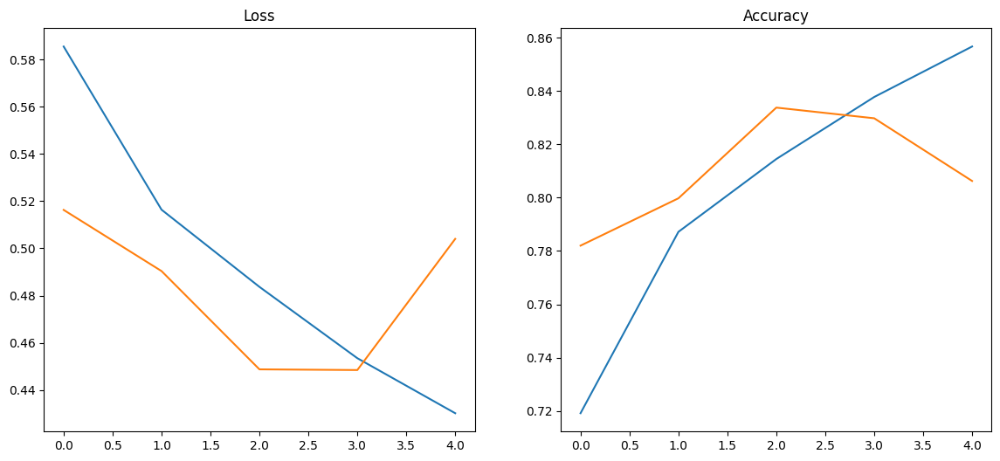

In [30]:
# plot loss and accuracy evolution
fig = plt.figure(figsize=(14,6))
ax1 = plt.subplot(121)
ax1.plot(range(len(results.history['loss'])),results.history['loss'])
ax1.plot(range(len(results.history['val_loss'])),results.history['val_loss'])
ax1.set_title('Loss')
ax2 = plt.subplot(122)
ax2.plot(range(len(results.history['binary_accuracy'])),results.history['binary_accuracy'])
ax2.plot(range(len(results.history['val_binary_accuracy'])),results.history['val_binary_accuracy'])
ax2.set_title('Accuracy')

In [31]:
model.evaluate(Test_ds)

125/125 ━━━━━━━━━━━━━━━━━━━━ 229s 2s/step - binary_accuracy: 0.8317 - loss: 0.4484


[0.45263639092445374, 0.8314999938011169]

In [32]:
model.evaluate(Test_ds_2)

41/41 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - binary_accuracy: 0.7702 - loss: 0.5269


[0.5322074890136719, 0.7703646421432495]

In [33]:
# extract Test dataset true and predicted labels
true_labels=[]
pred_labels=[]
for batch in iter(Test_ds):
    true_labels.append(batch[1])
    pred = model.predict(batch[0])
    pred_labels.append(pred)

true_labels_np = np.concatenate(true_labels)
pred_labels_np = np.concatenate(pred_labels)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 

In [34]:
# creat estimator class to wrap the tensorflow model as a sklearn classifier

class estimator:
    _estimator_type = ''
    classes_=[]
    def __init__(self, model, classes):
        self.model = model
        self._estimator_type = 'classifier'
        self.classes_ = classes
    def predict(self, X):
        y_pred= self.model.predict(X)
        return y_pred.round()

classifier = estimator(model, ["real","fake"])

125/125 ━━━━━━━━━━━━━━━━━━━━ 234s 2s/step


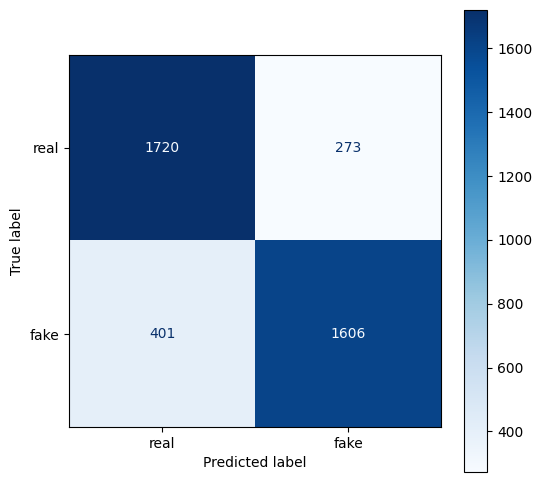

In [35]:
from sklearn.metrics import ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt

# Plot the confusion matrix for the Test dataset
fig, ax1 = plt.subplots(figsize=(6, 6))
ConfusionMatrixDisplay.from_estimator(
    classifier,
    X=Test_ds,
    y=true_labels_np,
    display_labels=["real", "fake"],
    cmap='Blues',
    ax=ax1
)
plt.show()

In [36]:
# calculate and show the classification report
print(classification_report(true_labels_np, pred_labels_np.round()))

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      1993
           1       0.85      0.80      0.83      2007

    accuracy                           0.83      4000
   macro avg       0.83      0.83      0.83      4000
weighted avg       0.83      0.83      0.83      4000

